In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [2]:

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

### Paths to data

In [3]:
TRAIN_PATH = "flowers_data"
train_dataset = datasets.ImageFolder(root=TRAIN_PATH, transform=transform)

# DataLoader
batch_size = 256
dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

### Hyperparameters:

In [21]:
latent_dim = 256
lr = 0.0003
beta1 = 0.5
beta2 = 0.999
num_epochs = 300

### Generator and Discriminator Architecture:

In [22]:
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, 4, 2, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(z.size(0), z.size(1), 1, 1)
        img = self.model(z)
        return img


# 6. Discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, 1, 0)
        )

    def forward(self, img):
        validity = self.model(img)
        return validity.view(-1, 1)
    
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)

### Loss and  Optimizers

In [23]:
adversarial_loss = nn.BCEWithLogitsLoss()
optimizer_G = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, beta2))
optimizer_D = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, beta2))

### Weight Initialization


In [24]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0.0)

generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (8): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1))
  )
)

### Training Loop

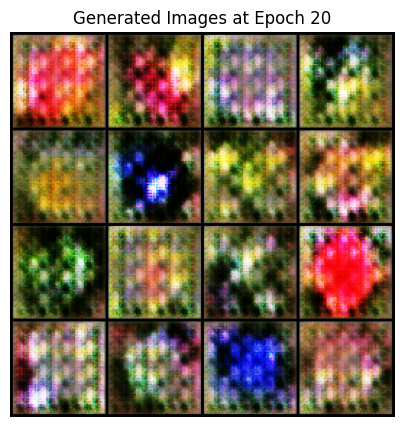

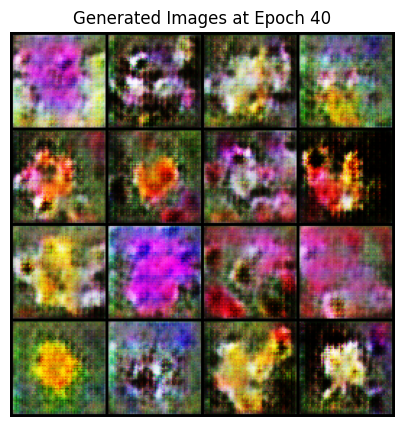

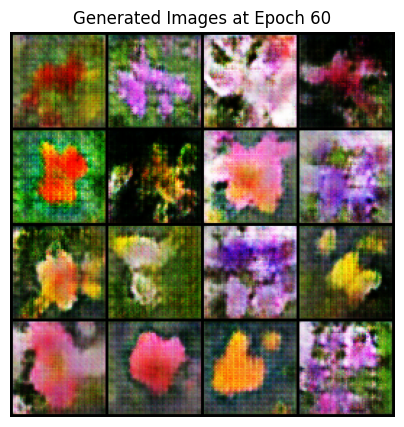

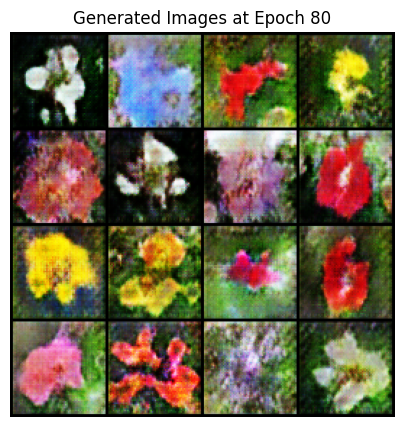

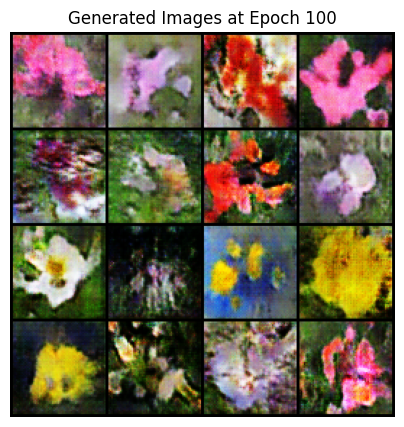

...

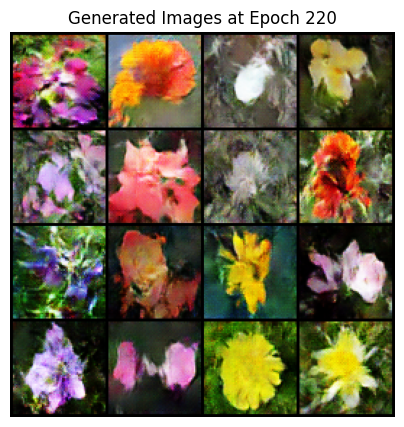

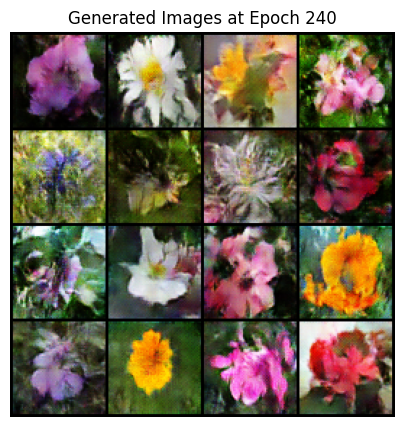

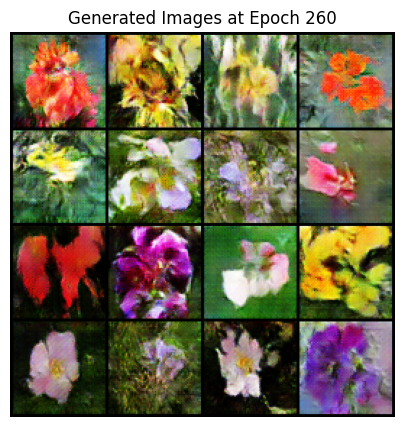

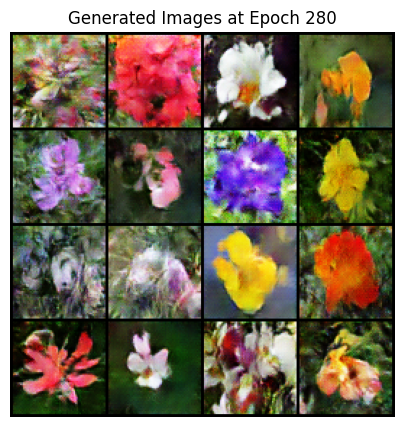

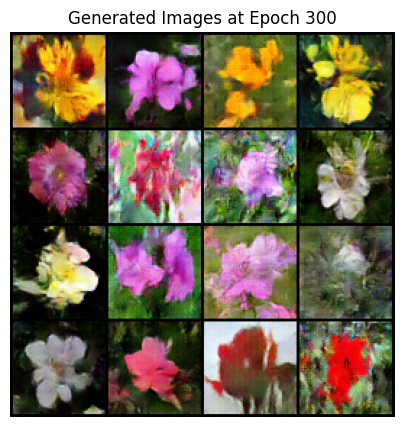

In [25]:
generator_losses = []
discriminator_losses = []

for epoch in range(num_epochs):
    g_loss_epoch = 0.0
    d_loss_epoch = 0.0

    for i, (real_images, _) in enumerate(dataloader):
        real_images = real_images.to(device)
        b_size = real_images.size(0)

        valid = torch.ones(b_size, 1, device=device)
        fake = torch.zeros(b_size, 1, device=device)

        # Train Discriminator
        optimizer_D.zero_grad()
        z = torch.randn(b_size, latent_dim, device=device)
        fake_images = generator(z)

        real_loss = adversarial_loss(discriminator(real_images), valid)
        fake_loss = adversarial_loss(discriminator(fake_images.detach()), fake)
        d_loss = real_loss + fake_loss
        d_loss.backward()
        optimizer_D.step()

        # Train Generator
        optimizer_G.zero_grad()
        z = torch.randn(b_size, latent_dim, device=device)
        fake_images = generator(z)
        gen_loss = adversarial_loss(discriminator(fake_images), valid)
        gen_loss.backward()
        optimizer_G.step()

        g_loss_epoch += gen_loss.item()
        d_loss_epoch += d_loss.item()

    # Average losses for the epoch
    generator_losses.append(g_loss_epoch / len(dataloader))
    discriminator_losses.append(d_loss_epoch / len(dataloader))

    # Visualization every 5 epochs
    if (epoch + 1) % 20 == 0:
        with torch.no_grad():
            z = torch.randn(16, latent_dim, device=device)
            generated = generator(z).cpu()
            grid = torchvision.utils.make_grid(generated, nrow=4, normalize=True)
            plt.figure(figsize=(5, 5))
            plt.imshow(np.transpose(grid, (1, 2, 0)))
            plt.title(f"Generated Images at Epoch {epoch+1}")
            plt.axis("off")
            plt.show()

### Discriminator Loss as a Function of Epochs

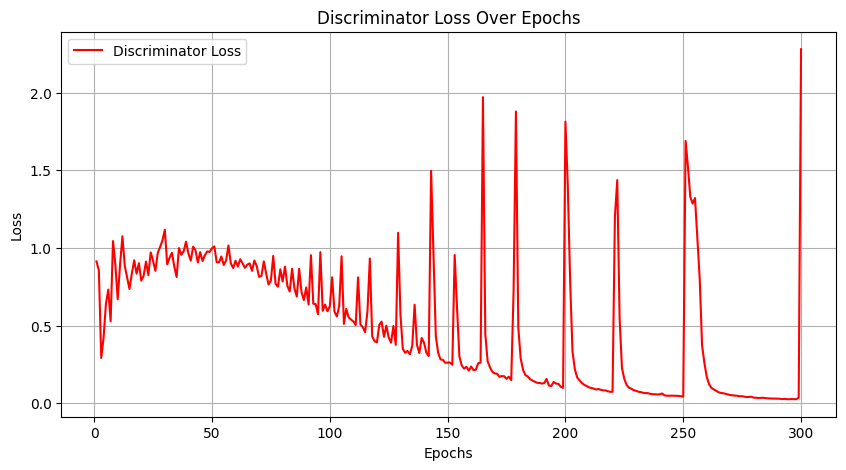

In [147]:
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), discriminator_losses, label='Discriminator Loss', color='red')
plt.title("Discriminator Loss Over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()

The discriminator loss fluctuates significantly during training, reflecting the adversarial nature of GANs. The spikes indicate periods where the discriminator briefly dominates, but overall, the loss decreases, showing that the generator improves in fooling the discriminator over time.

### Generator Loss as a Function of Epochs

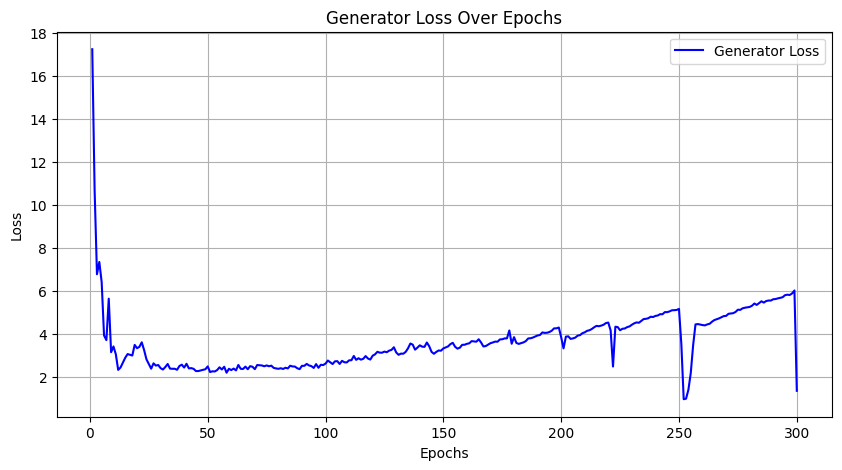

In [146]:
# Plot Generator Loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), generator_losses, label='Generator Loss', color='blue')
plt.title("Generator Loss Over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()### Generator Loss as a Function of Epochs

The generator loss decreases sharply in the initial epochs, indicating rapid learning, and stabilizes around epoch 50. However, small fluctuations in later epochs suggest continued competition with the discriminator as the model refines its outputs.

### Visualization of Latent Space

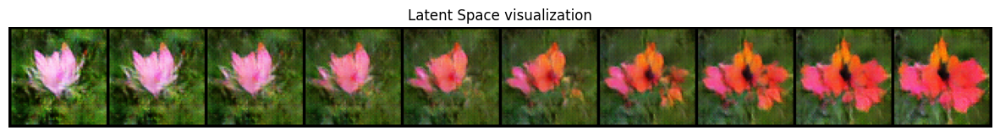

In [144]:
def visualize_latent_interpolation(generator, latent_dim, steps=10):
    generator.eval()
    with torch.no_grad():
        # Generate two random latent vectors
        z1 = torch.randn(1, latent_dim, device=device)
        z2 = torch.randn(1, latent_dim, device=device)

        # Interpolate between z1 and z2
        interpolations = torch.stack([z1 + (z2 - z1) * alpha for alpha in np.linspace(0, 1, steps)], dim=0)

        # Reshape interpolations to match the generator input shape
        interpolations = interpolations.view(steps, latent_dim, 1, 1)

        # Generate images from interpolations
        interpolated_images = generator(interpolations).cpu()

        # Create a grid of the interpolated images
        grid = torchvision.utils.make_grid(interpolated_images, nrow=steps, normalize=True, padding=2)
        plt.figure(figsize=(15, 6))
        plt.imshow(np.transpose(grid, (1, 2, 0)))
        plt.title("Latent Space visualization")
        plt.axis("off")
        plt.show()
        
visualize_latent_interpolation(generator, latent_dim, steps=10)

### Reproduce

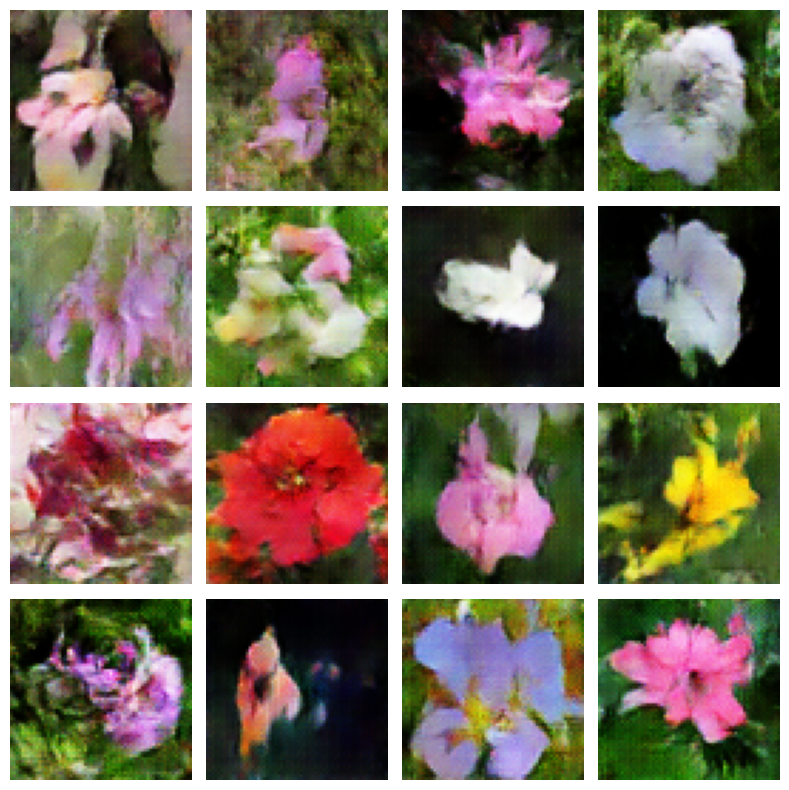

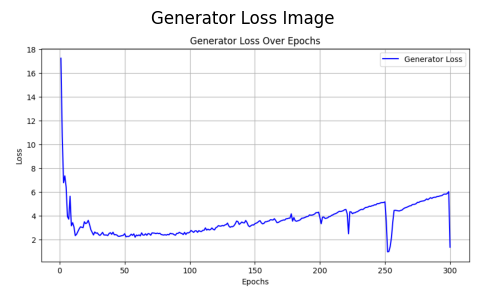

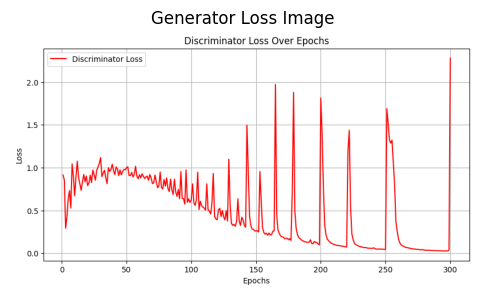

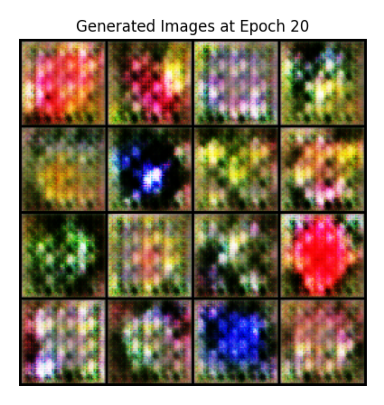

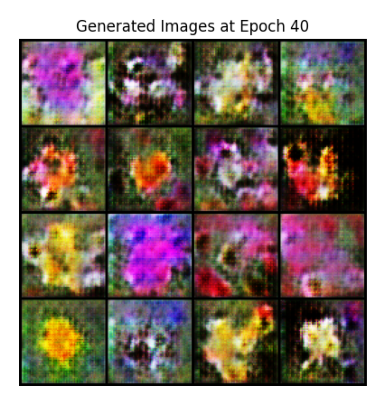

...

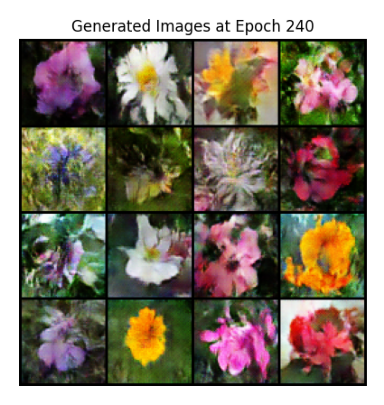

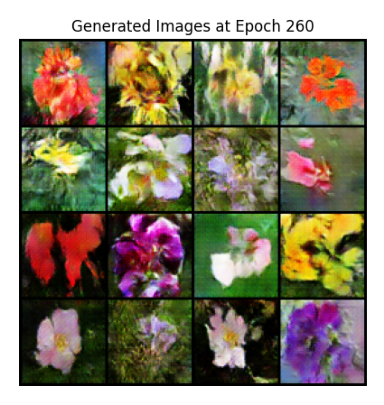

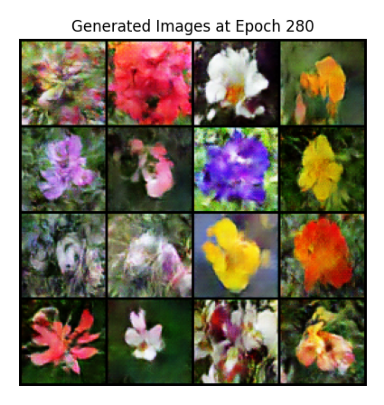

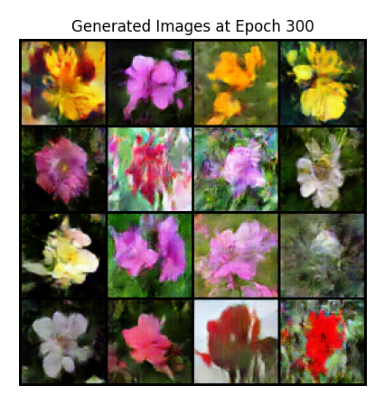

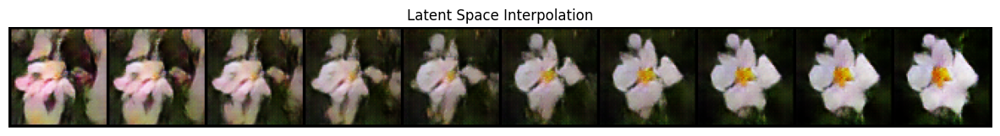

Reproduction complete.


In [31]:
def reproduce_hw4():

    import os
    import torch
    import torch.nn as nn
    import torch.optim as optim
    import torchvision
    import torchvision.utils as vutils
    from torchvision import transforms
    import matplotlib.pyplot as plt
    import numpy as np
    import random
    import time
    import re
    from PIL import Image

    # -------------------------
    # Set up Reproducibility
    # -------------------------
    def set_seed(seed=42):
        random.seed(seed)
        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False 
    set_seed(42)

    # -------------------------
    # Define Model Constants
    # -------------------------
    latent_dim = 256
    lr = 0.0003
    beta1 = 0.5
    beta2 = 0.999
    num_epochs = 300

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # -------------------------
    # Define Model Architectures
    # -------------------------
    class Generator(nn.Module):
        def __init__(self, latent_dim):
            super(Generator, self).__init__()
            self.model = nn.Sequential(
                nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, 2, 1),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, 2, 1),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, 2, 1),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, 2, 1),
                nn.Tanh()
            )

        def forward(self, z):
            z = z.view(z.size(0), z.size(1), 1, 1)
            img = self.model(z)
            return img


    # 6. Discriminator
    class Discriminator(nn.Module):
        def __init__(self):
            super(Discriminator, self).__init__()
            self.model = nn.Sequential(
                nn.Conv2d(3, 64, 4, 2, 1),
                nn.LeakyReLU(0.2, inplace=True),
                nn.Conv2d(64, 128, 4, 2, 1),
                nn.LeakyReLU(0.2, inplace=True),
                nn.Conv2d(128, 256, 4, 2, 1),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(0.2, inplace=True),
                nn.Conv2d(256, 512, 4, 2, 1),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(0.2, inplace=True),
                nn.Conv2d(512, 1, 4, 1, 0)
            )

        def forward(self, img):
            validity = self.model(img)
            return validity.view(-1, 1)
    

    # -------------------------
    # Load Trained Models
    # -------------------------
    generator = Generator(latent_dim).to(device)
    discriminator = Discriminator().to(device)

    # Load the checkpoint
    checkpoint = torch.load("fixed_GAN_Model.pkl", map_location=device, weights_only=False)
    
    generator.load_state_dict(checkpoint['generator'])
    discriminator.load_state_dict(checkpoint['discriminator'])

    generator.eval()
    discriminator.eval()
    

    # -------------------------
    # Generate Fixed Noise Samples
    # -------------------------
    set_seed(42)
    with torch.no_grad():
        fixed_noise = torch.randn(16, latent_dim, 1, 1, device=device)
        fake_images = generator(fixed_noise).cpu()

    fake_images = (fake_images + 1) / 2.0  # Convert from [-1,1] to [0,1]

    plt.figure(figsize=(8, 8))
    for i in range(16):
        plt.subplot(4, 4, i + 1)
        plt.imshow(np.transpose(fake_images[i].numpy(), (1, 2, 0)))
        plt.axis("off")
    plt.tight_layout()
    plt.show()
        
    # -------------------------
    # Plot Generator & Discriminator Losses
    # -------------------------

    # Load the image
    image = Image.open("Generator_Loss.png")
    # Display the image
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis("off")
    plt.title("Generator Loss Image")
    plt.show()

    image = Image.open("Discriminator_Loss.png")     
    # Display the image
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis("off")
    plt.title("Generator Loss Image")
    plt.show()
                               
    # -------------------------
    # Display All Saved Images from Training
    # -------------------------
    def natural_sort_key(s):
        """ Extract numbers from the filename and sort naturally. """
        return [int(text) if text.isdigit() else text.lower() for text in re.split(r'(\d+)', s)]

    IMAGE_SAVE_DIR = "Genrated_GAN_Photos"

    if os.path.exists(IMAGE_SAVE_DIR):
        images = sorted(os.listdir(IMAGE_SAVE_DIR), key=natural_sort_key) # Ensure order by epoch number
        for img_file in images:
            img_path = os.path.join(IMAGE_SAVE_DIR, img_file)
            img = plt.imread(img_path)
            plt.figure(figsize=(5, 5))
            plt.imshow(img)
            plt.axis("off")
            plt.show()
    else:
        print(f"Warning: {IMAGE_SAVE_DIR} folder not found. No saved images to display.")

    # -------------------------
    # Latent Space Interpolation
    # -------------------------
    set_seed(42)
    with torch.no_grad():
        z1 = torch.randn(1, latent_dim, device=device)
        z2 = torch.randn(1,latent_dim, device=device)

        interpolations = torch.stack([z1 + (z2 - z1) * alpha for alpha in np.linspace(0, 1, 10)], dim=0)
        interpolations = interpolations.view(10, latent_dim, 1, 1)

        interpolated_images = generator(interpolations).cpu()

        grid = torchvision.utils.make_grid(interpolated_images, nrow=10, normalize=True, padding=2)
        plt.figure(figsize=(15, 6))
        plt.imshow(np.transpose(grid, (1, 2, 0)))
        plt.title("Latent Space Interpolation")
        plt.axis("off")
        plt.show()

    print("Reproduction complete.")

# Run the function to reproduce all results
reproduce_hw4()
